## TP 04: Transformada de Fourier

In [1]:
from skimage import data, io, filters
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from skimage import data
from scipy import misc
from skimage.util.dtype import dtype_range
from skimage.util import img_as_ubyte
from skimage import exposure
from skimage.morphology import disk
from skimage.filters import rank
import seaborn as sns
import matplotlib.image as mpimg

# Importamos las imagenes con objetos geometricos a utilizar

In [2]:
im0 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_00.jpg')
im1 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_01.jpg')
im2 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_02.jpg')
im3 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_03.jpg')
im4 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_04.jpg')
im5 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_05.jpg')
im6 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_06.jpg')
im7 = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/tp04_ft/ft_07.jpg')

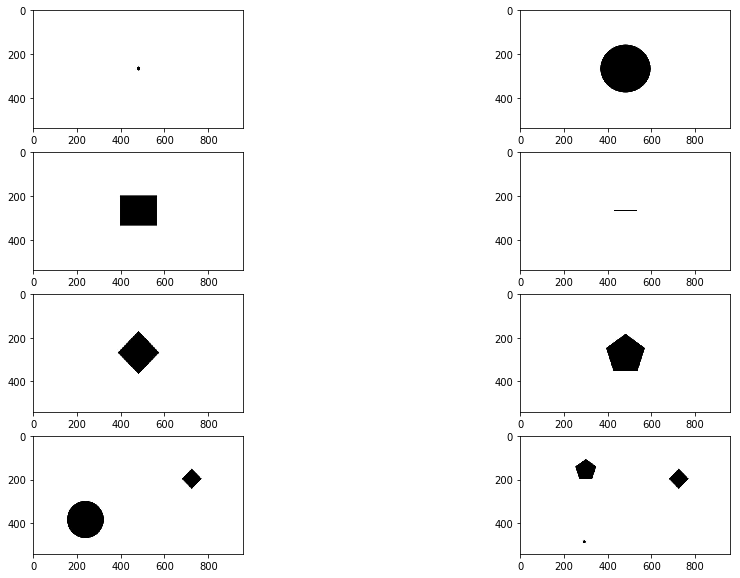

In [3]:
f, axarr = plt.subplots(4,2)
f.set_size_inches(16, 10)
axarr[0,0].imshow(im0)
axarr[0,1].imshow(im1)
axarr[1,0].imshow(im2)
axarr[1,1].imshow(im3)
axarr[2,0].imshow(im4)
axarr[2,1].imshow(im5)
axarr[3,0].imshow(im6)
axarr[3,1].imshow(im7)
plt.show()

In [4]:
# Normalizamos las imagenes entre 0 y 1.
imnorm0 = im0.astype(float) / 255
imnorm1 = im1.astype(float) / 255
imnorm2 = im2.astype(float) / 255
imnorm3 = im3.astype(float) / 255
imnorm4 = im4.astype(float) / 255
imnorm5 = im5.astype(float) / 255
imnorm6 = im6.astype(float) / 255
imnorm7 = im7.astype(float) / 255

# Pasamos imagenes del espacio RGB a YIQ

In [5]:
to_yiq = np.array([[0.299,0.587, 0.114], 
                   [0.595716, -0.274453, -0.321263], 
                   [0.211456, -0.522591, 0.311135]])

In [6]:
to_rgb = np.array([[1  ,    0.9663, 0.621], 
                   [1  ,  -0.2721, -0.6474], 
                   [1  ,  -1.107, 1.7046]])

In [7]:
# Matrices para las imagenes originales
yiq0 = np.zeros((np.shape(imnorm0)[0],np.shape(imnorm0)[1],np.shape(imnorm0)[2]))
yiq1 = np.zeros((np.shape(imnorm1)[0],np.shape(imnorm1)[1],np.shape(imnorm1)[2]))
yiq2 = np.zeros((np.shape(imnorm2)[0],np.shape(imnorm2)[1],np.shape(imnorm2)[2]))
yiq3 = np.zeros((np.shape(imnorm3)[0],np.shape(imnorm3)[1],np.shape(imnorm3)[2]))
yiq4 = np.zeros((np.shape(imnorm4)[0],np.shape(imnorm4)[1],np.shape(imnorm4)[2]))
yiq5 = np.zeros((np.shape(imnorm5)[0],np.shape(imnorm5)[1],np.shape(imnorm5)[2]))
yiq6 = np.zeros((np.shape(imnorm6)[0],np.shape(imnorm6)[1],np.shape(imnorm6)[2]))
yiq7 = np.zeros((np.shape(imnorm7)[0],np.shape(imnorm7)[1],np.shape(imnorm7)[2]))

yiq0 = np.matmul(imnorm0,to_yiq.T)
yiq1 = np.matmul(imnorm1,to_yiq.T)
yiq2 = np.matmul(imnorm2,to_yiq.T)
yiq3 = np.matmul(imnorm3,to_yiq.T)
yiq4 = np.matmul(imnorm4,to_yiq.T)
yiq5 = np.matmul(imnorm5,to_yiq.T)
yiq6 = np.matmul(imnorm6,to_yiq.T)
yiq7 = np.matmul(imnorm7,to_yiq.T)


In [8]:
# Aseguramos que las imagenes en YIQ esten dentro de los rangos aceptables.
yiq0[yiq0[:,:,0] >1,0] = 1
yiq0[yiq0[:,:,1] > 0.5957,1] = 0.5957
yiq0[yiq0[:,:,1] < -0.5957,1] = -0.5957
yiq0[yiq0[:,:,2] > 0.5226,2] = 0.5226
yiq0[yiq0[:,:,2] < -0.5226,2] = -0.5226

yiq1[yiq1[:,:,0] >1,0] = 1
yiq1[yiq1[:,:,1] > 0.5957,1] = 0.5957
yiq1[yiq1[:,:,1] < -0.5957,1] = -0.5957
yiq1[yiq1[:,:,2] > 0.5226,2] = 0.5226
yiq1[yiq1[:,:,2] < -0.5226,2] = -0.5226

yiq2[yiq2[:,:,0] >1,0] = 1
yiq2[yiq2[:,:,1] >0.5957,1] = 0.5957
yiq2[yiq2[:,:,1] <-0.5957,1] = -0.5957
yiq2[yiq2[:,:,2] >0.5226,2] = 0.5226
yiq2[yiq2[:,:,2] <-0.5226,2] = -0.5226

yiq3[yiq3[:,:,0] >1,0] = 1
yiq3[yiq3[:,:,1] > 0.5957,1] = 0.5957
yiq3[yiq3[:,:,1] < -0.5957,1] = -0.5957
yiq3[yiq3[:,:,2] > 0.5226,2] = 0.5226
yiq3[yiq3[:,:,2] < -0.5226,2] = -0.5226

yiq4[yiq4[:,:,0] >1,0] = 1
yiq4[yiq4[:,:,1] > 0.5957,1] = 0.5957
yiq4[yiq4[:,:,1] < -0.5957,1] = -0.5957
yiq4[yiq4[:,:,2] > 0.5226,2] = 0.5226
yiq4[yiq4[:,:,2] < -0.5226,2] = -0.5226

yiq5[yiq5[:,:,0] >1,0] = 1
yiq5[yiq5[:,:,1] > 0.5957,1] = 0.5957
yiq5[yiq5[:,:,1] < -0.5957,1] = -0.5957
yiq5[yiq5[:,:,2] > 0.5226,2] = 0.5226
yiq5[yiq5[:,:,2] < -0.5226,2] = -0.5226

yiq6[yiq6[:,:,0] >1,0] = 1
yiq6[yiq6[:,:,1] > 0.5957,1] = 0.5957
yiq6[yiq6[:,:,1] < -0.5957,1] = -0.5957
yiq6[yiq6[:,:,2] > 0.5226,2] = 0.5226
yiq6[yiq6[:,:,2] < -0.5226,2] = -0.5226

yiq7[yiq7[:,:,0] >1,0] = 1
yiq7[yiq7[:,:,1] > 0.5957,1] = 0.5957
yiq7[yiq7[:,:,1] < -0.5957,1] = -0.5957
yiq7[yiq7[:,:,2] > 0.5226,2] = 0.5226
yiq7[yiq7[:,:,2] < -0.5226,2] = -0.5226

## Definimos la semi-transformada discreta de Fourier para 2 dimensiones, primero por filas y luego por columnas.

In [9]:
def discrete_fourier_transform_2d(yiq):
    
    # creo 2 matrices vacias, la primera para aplicar la FT y la segunda tendra los cuadrantes ordenados
    ft_ = np.zeros((np.shape(yiq)[0],np.shape(yiq)[1]),dtype=np.complex_)
    ft = np.zeros((np.shape(yiq)[0],np.shape(yiq)[1]),dtype=np.complex_)

    # primero hago la TF por filas 
    for i in range(0,np.shape(ft_)[0]):
        ft_[i,:] = np.fft.fft(yiq[i,:])
    
    # luego hago la TF por columnas
    for j in range(0,np.shape(ft_)[1]):
        ft_[:,j] = np.fft.fft(ft_[:,j])    

    # obtengo las dimensiones de la matriz resultante   
    d1 = np.shape(ft_)[0]
    d2 = np.shape(ft_)[1]

    # obtengo los cuadrantes a ser ordenados
    q1 = ft_[:int(d1*0.5),:int(d2*0.5)]
    q2 = ft_[int(d1*0.5):,:int(d2*0.5)]
    q3 = ft_[:int(d1*0.5),int(d2*0.5):]
    q4 = ft_[int(d1*0.5):,int(d2*0.5):]

    # ordeno los cuadrantes
    ft[:int(d1*0.5),:int(d2*0.5)] = q4
    ft[int(d1*0.5):,int(d2*0.5):] = q1
    ft[int(d1*0.5):,:int(d2*0.5)] = q3
    ft[:int(d1*0.5),int(d2*0.5):] = q2

    # obtengo la Fase y Modulo/magnitud
    phase = np.angle(ft)
    magnitude = 23*np.log10(np.sqrt(ft.imag**2 + ft.real**2))
    
    return magnitude, phase

### Obtengo la amplitud y fase de la FT para cada imagen

In [10]:
magnitude0 = discrete_fourier_transform_2d(yiq0[:,:,0])[0]
magnitude1 = discrete_fourier_transform_2d(yiq1[:,:,0])[0]
magnitude2 = discrete_fourier_transform_2d(yiq2[:,:,0])[0]
magnitude3 = discrete_fourier_transform_2d(yiq3[:,:,0])[0]
magnitude4 = discrete_fourier_transform_2d(yiq4[:,:,0])[0]
magnitude5 = discrete_fourier_transform_2d(yiq5[:,:,0])[0]
magnitude6 = discrete_fourier_transform_2d(yiq6[:,:,0])[0]
magnitude7 = discrete_fourier_transform_2d(yiq7[:,:,0])[0]

phase0 = discrete_fourier_transform_2d(yiq0[:,:,0])[1]
phase1 = discrete_fourier_transform_2d(yiq1[:,:,0])[1]
phase2 = discrete_fourier_transform_2d(yiq2[:,:,0])[1]
phase3 = discrete_fourier_transform_2d(yiq3[:,:,0])[1]
phase4 = discrete_fourier_transform_2d(yiq4[:,:,0])[1]
phase5 = discrete_fourier_transform_2d(yiq5[:,:,0])[1]
phase6 = discrete_fourier_transform_2d(yiq6[:,:,0])[1]
phase7 = discrete_fourier_transform_2d(yiq7[:,:,0])[1]

# Transformada de Fourier en circunferencias

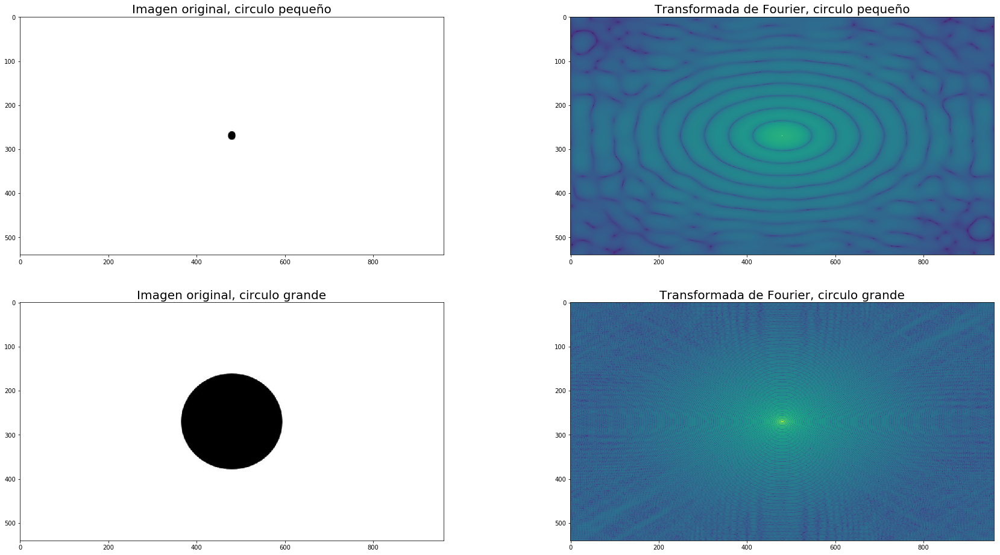

In [11]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,0].imshow(im0)
axarr[0,0].grid(False)
axarr[0,0].set_title("Imagen original, circulo pequeño", fontsize=20)
axarr[0,1].imshow(magnitude0)
axarr[0,1].grid(False)
axarr[0,1].set_title("Transformada de Fourier, circulo pequeño", fontsize=20)

axarr[1,0].imshow(im1)
axarr[1,0].grid(False)
axarr[1,0].set_title("Imagen original, circulo grande", fontsize=20)
axarr[1,1].imshow(magnitude1)
axarr[1,1].grid(False)
axarr[1,1].set_title("Transformada de Fourier, circulo grande", fontsize=20)

plt.show()

# Transformada de Fourier en poligonos

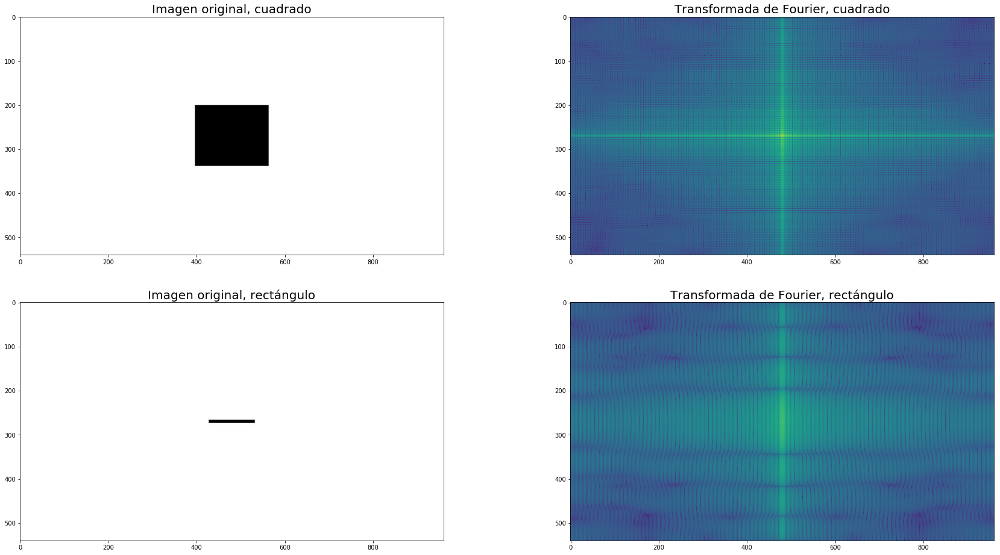

In [12]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,0].imshow(im2)
axarr[0,0].grid(False)
axarr[0,0].set_title("Imagen original, cuadrado", fontsize=20)
axarr[0,1].imshow(magnitude2)
axarr[0,1].grid(False)
axarr[0,1].set_title("Transformada de Fourier, cuadrado", fontsize=20)

axarr[1,0].imshow(im3)
axarr[1,0].grid(False)
axarr[1,0].set_title("Imagen original, rectángulo", fontsize=20)
axarr[1,1].imshow(magnitude3)
axarr[1,1].grid(False)
axarr[1,1].set_title("Transformada de Fourier, rectángulo", fontsize=20)

plt.show()

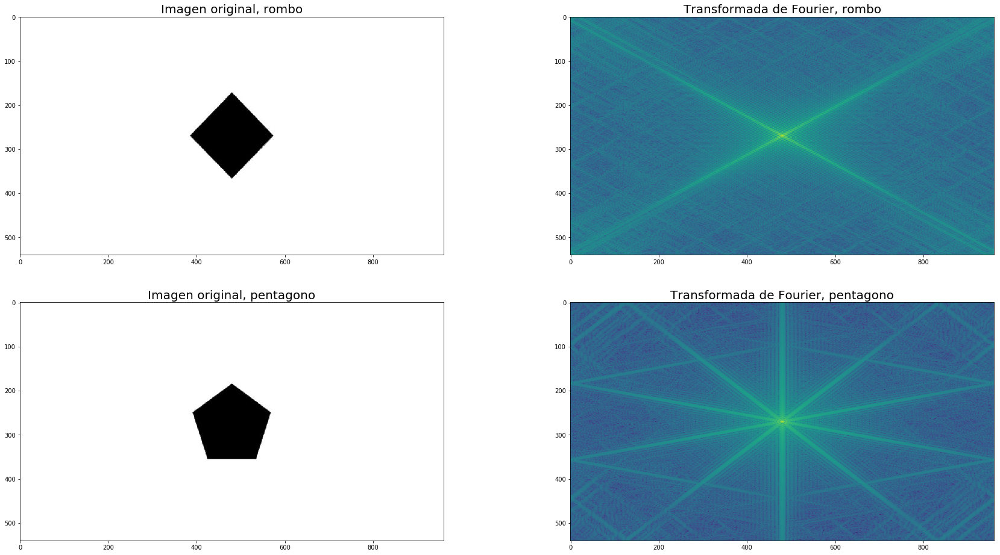

In [13]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,0].imshow(im4)
axarr[0,0].grid(False)
axarr[0,0].set_title("Imagen original, rombo", fontsize=20)
axarr[0,1].imshow(magnitude4)
axarr[0,1].grid(False)
axarr[0,1].set_title("Transformada de Fourier, rombo", fontsize=20)

axarr[1,0].imshow(im5)
axarr[1,0].grid(False)
axarr[1,0].set_title("Imagen original, pentagono", fontsize=20)
axarr[1,1].imshow(magnitude5)
axarr[1,1].grid(False)
axarr[1,1].set_title("Transformada de Fourier, pentagono", fontsize=20)

plt.show()

# Transformada de Fourier en con multiples objetos

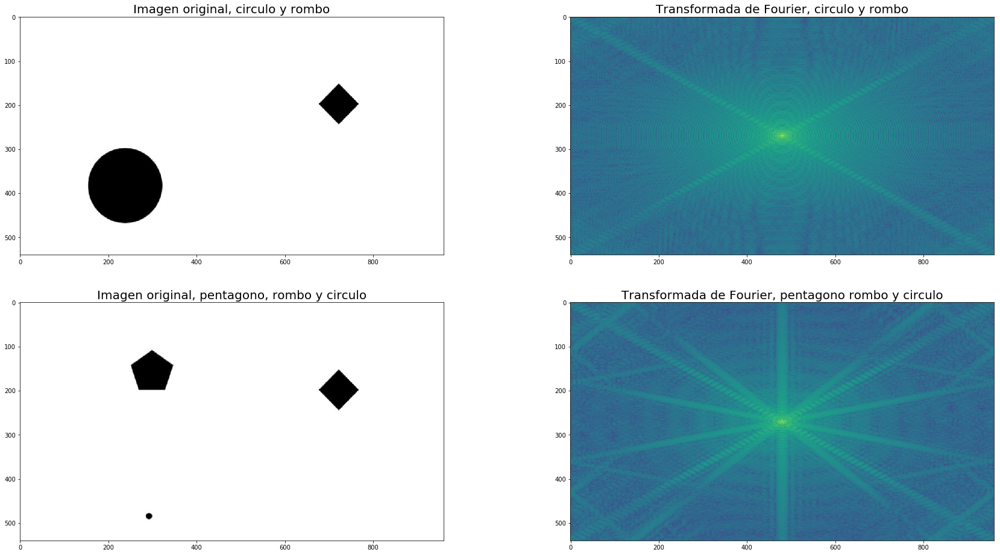

In [14]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,0].imshow(im6)
axarr[0,0].grid(False)
axarr[0,0].set_title("Imagen original, circulo y rombo", fontsize=20)
axarr[0,1].imshow(magnitude6)
axarr[0,1].grid(False)
axarr[0,1].set_title("Transformada de Fourier, circulo y rombo", fontsize=20)

axarr[1,0].imshow(im7)
axarr[1,0].grid(False)
axarr[1,0].set_title("Imagen original, pentagono, rombo y circulo", fontsize=20)
axarr[1,1].imshow(magnitude7)
axarr[1,1].grid(False)
axarr[1,1].set_title("Transformada de Fourier, pentagono rombo y circulo", fontsize=20)

plt.show()

# Transformada Inversa de Fourier

In [15]:
# defino la semi transformada inversa de fourier en 2 dimensiones
def discrete_fourier_transform_inv(magnitude, phase):
    
    # utilizando el modulo y la fase obtengo la parte real e imaginaria de la FT
    magn = 10**(magnitude/23)
    ft_i = magn * np.sin(phase)
    ft_r = magn * np.cos(phase)
    ft = ft_r + 1j*ft_i
    
    # ordeno los cuadrantes
    q1 = ft[:int(np.shape(magnitude)[0]*0.5),:int(np.shape(magnitude)[1]*0.5)]
    q2 = ft[int(np.shape(magnitude)[0]*0.5):,:int(np.shape(magnitude)[1]*0.5)]
    q3 = ft[:int(np.shape(magnitude)[0]*0.5),int(np.shape(magnitude)[1]*0.5):]
    q4 = ft[int(np.shape(magnitude)[0]*0.5):,int(np.shape(magnitude)[1]*0.5):]
    
    ft_ord = np.zeros((np.shape(magnitude)),dtype=np.complex_)
    ft_ord[int(np.shape(magnitude)[0]*0.5):,int(np.shape(magnitude)[1]*0.5):] = q1
    ft_ord[:int(np.shape(magnitude)[0]*0.5),int(np.shape(magnitude)[1]*0.5):] = q2
    ft_ord[int(np.shape(magnitude)[0]*0.5):,:int(np.shape(magnitude)[1]*0.5)] = q3
    ft_ord[:int(np.shape(magnitude)[0]*0.5),:int(np.shape(magnitude)[1]*0.5)] = q4
    
    im_out = np.zeros((np.shape(magnitude)),dtype=np.complex_)
    
    # FT inversa por filas
    for i in range(np.shape(magnitude)[0]):
        im_out[i,:] = np.fft.ifft(ft_ord[i,:])
    
    # FT inversa por columnas
    for j in range(np.shape(magnitude)[1]):
        im_out[:,j] = np.fft.ifft(im_out[:,j])
    
    return im_out.real, im_out.imag

### Aplico la TF inversa al modulo y fase obtenido de la TF de cada imagen

In [16]:
im0inv = discrete_fourier_transform_inv(magnitude0,phase0)[0]
im1inv = discrete_fourier_transform_inv(magnitude1,phase1)[0]
im2inv = discrete_fourier_transform_inv(magnitude2,phase2)[0]
im3inv = discrete_fourier_transform_inv(magnitude3,phase3)[0]
im4inv = discrete_fourier_transform_inv(magnitude4,phase4)[0]
im5inv = discrete_fourier_transform_inv(magnitude5,phase5)[0]
im6inv = discrete_fourier_transform_inv(magnitude6,phase6)[0]
im7inv = discrete_fourier_transform_inv(magnitude7,phase7)[0]

### Visualizo el espacio de la amplitud y la reconstruccion via TF inversa de cada imagen

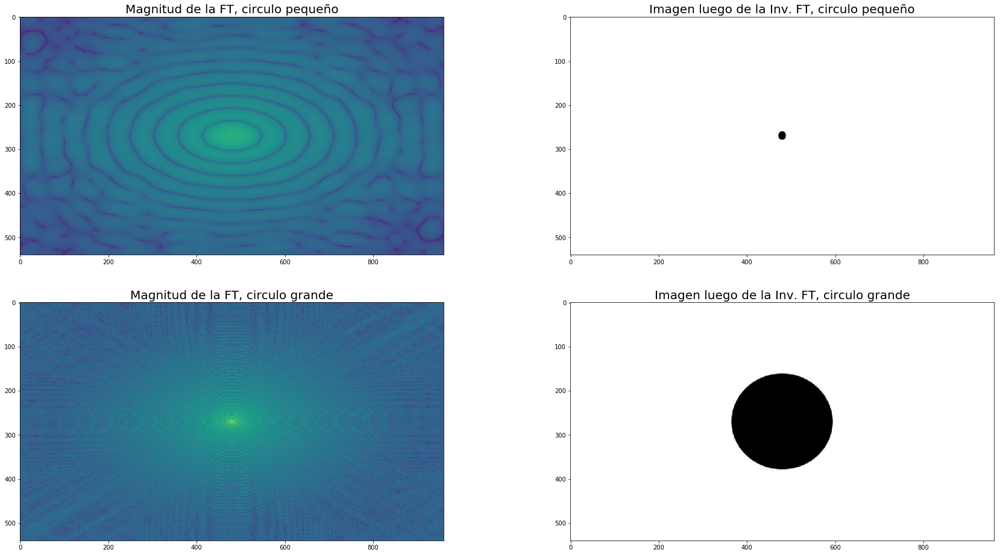

In [17]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,1].imshow(im0inv,cmap='gray')
axarr[0,1].grid(False)
axarr[0,1].set_title("Imagen luego de la Inv. FT, circulo pequeño", fontsize=20)
axarr[0,0].imshow(magnitude0)
axarr[0,0].grid(False)
axarr[0,0].set_title("Magnitud de la FT, circulo pequeño", fontsize=20)

axarr[1,1].imshow(im1inv,cmap='gray')
axarr[1,1].grid(False)
axarr[1,1].set_title("Imagen luego de la Inv. FT, circulo grande", fontsize=20)
axarr[1,0].imshow(magnitude1)
axarr[1,0].grid(False)
axarr[1,0].set_title("Magnitud de la FT, circulo grande", fontsize=20)

plt.show()

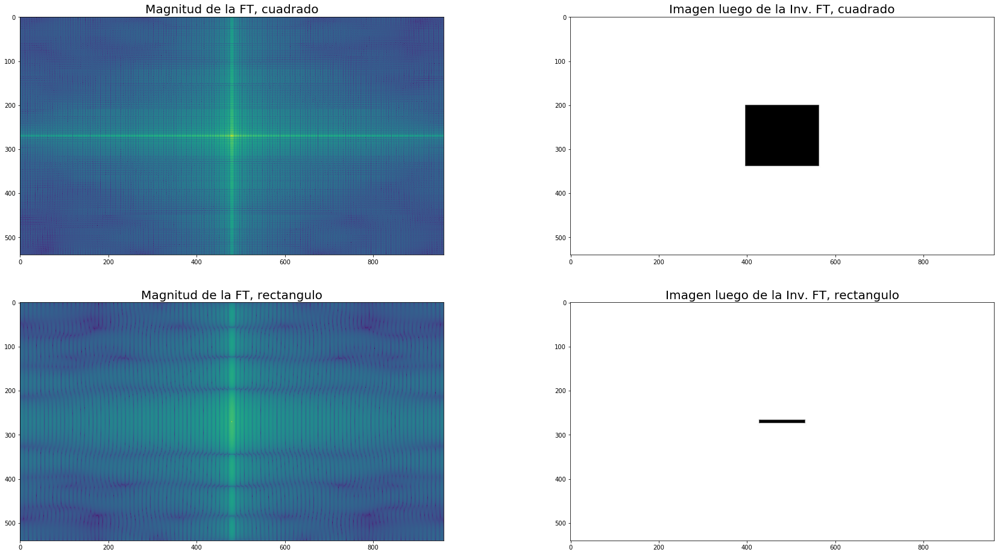

In [31]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,1].imshow(im2inv,cmap='gray')
axarr[0,1].grid(False)
axarr[0,1].set_title("Imagen luego de la Inv. FT, cuadrado", fontsize=20)
axarr[0,0].imshow(magnitude2)
axarr[0,0].grid(False)
axarr[0,0].set_title("Magnitud de la FT, cuadrado", fontsize=20)

axarr[1,1].imshow(im3inv,cmap='gray')
axarr[1,1].grid(False)
axarr[1,1].set_title("Imagen luego de la Inv. FT, rectangulo", fontsize=20)
axarr[1,0].imshow(magnitude3)
axarr[1,0].grid(False)
axarr[1,0].set_title("Magnitud de la FT, rectangulo", fontsize=20)

plt.show()

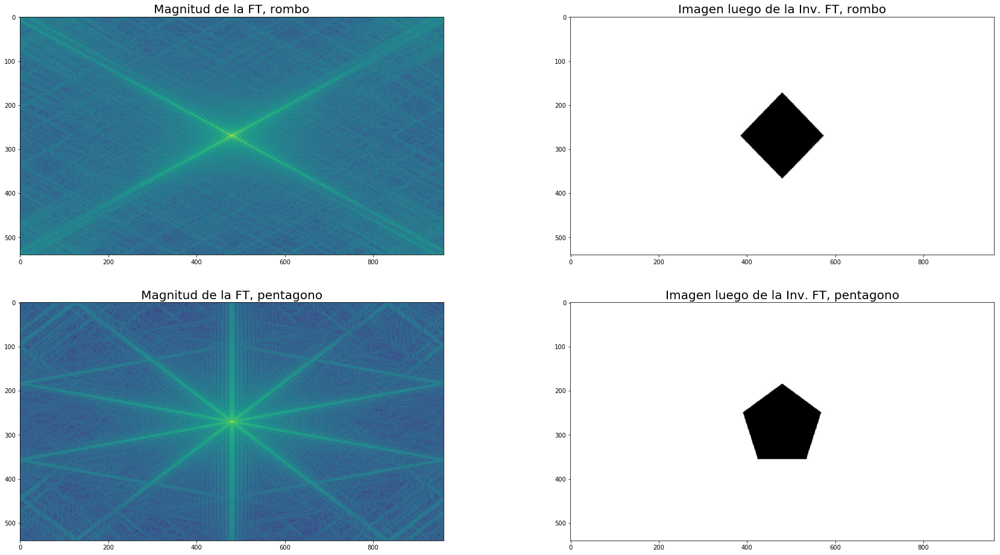

In [32]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,1].imshow(im4inv,cmap='gray')
axarr[0,1].grid(False)
axarr[0,1].set_title("Imagen luego de la Inv. FT, rombo", fontsize=20)
axarr[0,0].imshow(magnitude4)
axarr[0,0].grid(False)
axarr[0,0].set_title("Magnitud de la FT, rombo", fontsize=20)

axarr[1,1].imshow(im5inv,cmap='gray')
axarr[1,1].grid(False)
axarr[1,1].set_title("Imagen luego de la Inv. FT, pentagono", fontsize=20)
axarr[1,0].imshow(magnitude5)
axarr[1,0].grid(False)
axarr[1,0].set_title("Magnitud de la FT, pentagono", fontsize=20)

plt.show()

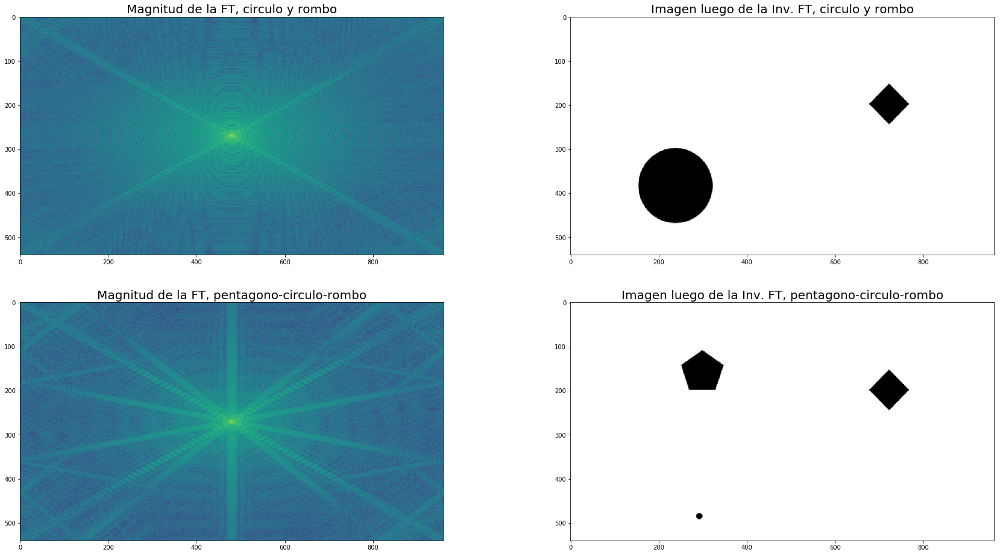

In [33]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(30,16)

axarr[0,1].imshow(im6inv,cmap='gray')
axarr[0,1].grid(False)
axarr[0,1].set_title("Imagen luego de la Inv. FT, circulo y rombo", fontsize=20)
axarr[0,0].imshow(magnitude6)
axarr[0,0].grid(False)
axarr[0,0].set_title("Magnitud de la FT, circulo y rombo", fontsize=20)

axarr[1,1].imshow(im7inv,cmap='gray')
axarr[1,1].grid(False)
axarr[1,1].set_title("Imagen luego de la Inv. FT, pentagono-circulo-rombo", fontsize=20)
axarr[1,0].imshow(magnitude7)
axarr[1,0].grid(False)
axarr[1,0].set_title("Magnitud de la FT, pentagono-circulo-rombo", fontsize=20)

plt.show()

# Edicion del espectro de amplitud

In [21]:
pwd

'/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes'

### Importo imagen de Planetario y Totem

In [22]:
planetario = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/planetario.jpg').astype(float) / 255
totem = io.imread('/home/human/Dropbox/doctorado/chapter00_courses/procesamiento_digital_imagenes/totem.jpg').astype(float) / 255

### Paso las imagenes al espacio YIQ

In [23]:
yiq_planet = np.zeros((np.shape(planetario)[0],np.shape(planetario)[1],np.shape(planetario)[2]))
yiq_planet = np.matmul(planetario,to_yiq.T)

yiq_totem = np.zeros((np.shape(totem)[0],np.shape(totem)[1],np.shape(totem)[2]))
yiq_totem = np.matmul(totem,to_yiq.T)

In [24]:
yiq_planet[yiq_planet[:,:,0] >1,0] = 1
yiq_planet[yiq_planet[:,:,1] > 0.5957,1] = 0.5957
yiq_planet[yiq_planet[:,:,1] < -0.5957,1] = -0.5957
yiq_planet[yiq_planet[:,:,2] > 0.5226,2] = 0.5226
yiq_planet[yiq_planet[:,:,2] < -0.5226,2] = -0.5226

yiq_totem[yiq_totem[:,:,0] >1,0] = 1
yiq_totem[yiq_totem[:,:,1] > 0.5957,1] = 0.5957
yiq_totem[yiq_totem[:,:,1] < -0.5957,1] = -0.5957
yiq_totem[yiq_totem[:,:,2] > 0.5226,2] = 0.5226
yiq_totem[yiq_totem[:,:,2] < -0.5226,2] = -0.5226

### Aplico la FT a las dos imagenes obteniendo Amplitud y Fase

In [25]:
magnitude_planet = discrete_fourier_transform_2d(yiq_planet[:,:,0])[0]
phase_planet = discrete_fourier_transform_2d(yiq_planet[:,:,0])[1]

magnitude_totem = discrete_fourier_transform_2d(yiq_totem[:,:,0])[0]
phase_totem = discrete_fourier_transform_2d(yiq_totem[:,:,0])[1]

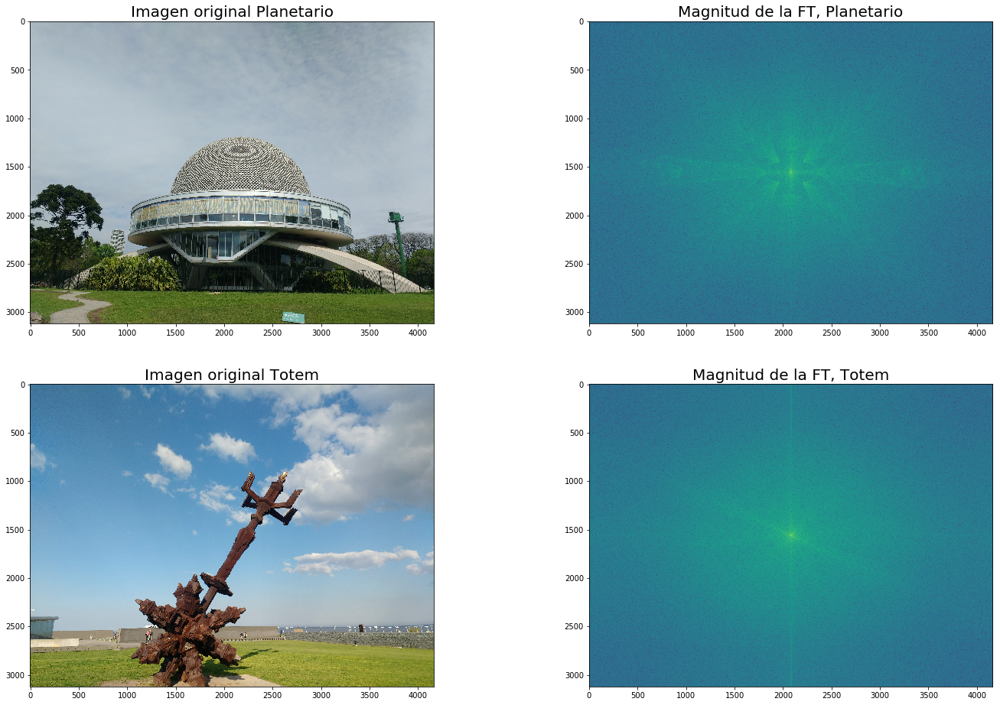

In [34]:
f, axarr = plt.subplots(2,2)
f.set_size_inches(24,16)

axarr[0,0].imshow(planetario,cmap='gray')
axarr[0,0].grid(False)
axarr[0,0].set_title("Imagen original Planetario", fontsize=20)
axarr[0,1].imshow(magnitude_planet)
axarr[0,1].grid(False)
axarr[0,1].set_title("Magnitud de la FT, Planetario", fontsize=20)

axarr[1,0].imshow(totem,cmap='gray')
axarr[1,0].grid(False)
axarr[1,0].set_title("Imagen original Totem", fontsize=20)
axarr[1,1].imshow(magnitude_totem)
axarr[1,1].grid(False)
axarr[1,1].set_title("Magnitud de la FT, Totem", fontsize=20)

plt.show()

### Guardamos la Magnitud de la TF de cada imagen para ser editadas

In [27]:
misc.imsave("magnitude_totem.png",magnitude_totem)
misc.imsave("magnitude_planet.png", magnitude_planet)

/home/human/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  """Entry point for launching an IPython kernel.
/home/human/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  


### Importamos la Magnitud ya editada para aplicarle la TF inversa 

In [28]:
magnitude_planet_edit = misc.imread("magnitude_planet_edit.png")
magnitude_totem_edit = misc.imread("magnitude_totem_edit.png")

planet_inv = discrete_fourier_transform_inv(magnitude_planet,phase_planet)[0]
planet_inv_edit = discrete_fourier_transform_inv(magnitude_planet_edit,phase_planet)[0]

totem_inv = discrete_fourier_transform_inv(magnitude_totem,phase_totem)[0]
totem_inv_edit = discrete_fourier_transform_inv(magnitude_totem_edit,phase_totem)[0]

/home/human/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.
/home/human/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


### Edicion con 2 pulsos a baja frecuencia laterales en imagen Planetario

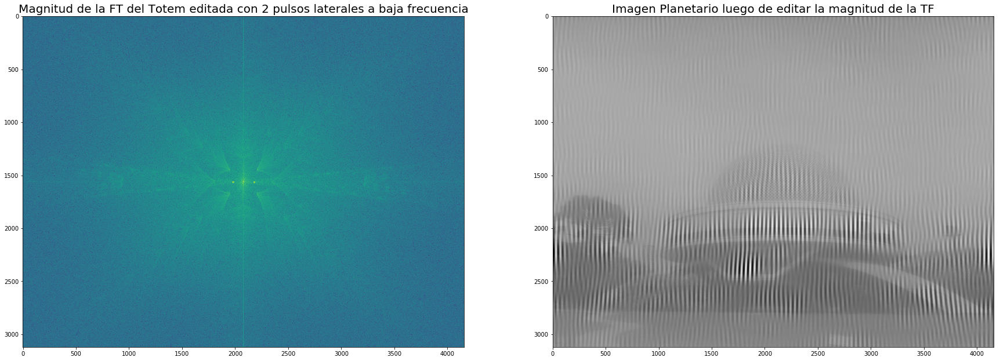

In [36]:
f, axarr = plt.subplots(1,2)
f.set_size_inches(30,16)

axarr[0].imshow(magnitude_planet_edit)
axarr[0].grid(False)
axarr[0].set_title("Magnitud de la FT del Planetario editada con 2 pulsos laterales a baja frecuencia", fontsize=20)
axarr[1].imshow(planet_inv_edit,cmap='gray')
axarr[1].grid(False)
axarr[1].set_title("Imagen Planetario luego de editar la magnitud de la TF", fontsize=20)

plt.show()

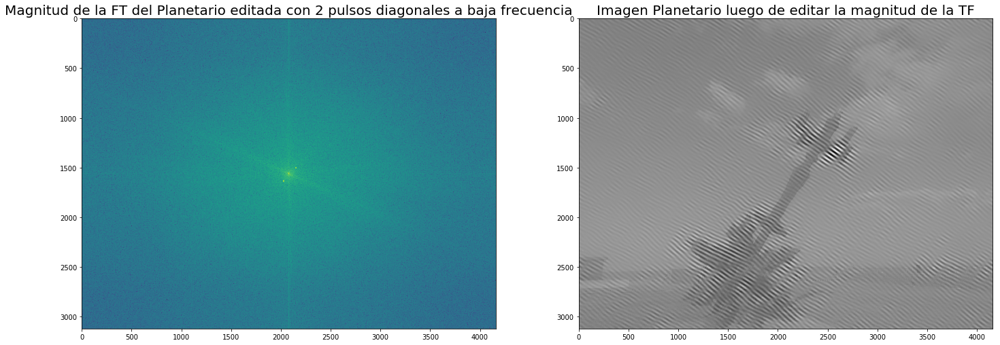

In [37]:
f, axarr = plt.subplots(1,2)
f.set_size_inches(24,16)

axarr[0].imshow(magnitude_totem_edit)
axarr[0].grid(False)
axarr[0].set_title("Magnitud de la FT del Planetario editada con 2 pulsos diagonales a baja frecuencia", fontsize=20)
axarr[1].imshow(totem_inv_edit,cmap='gray')
axarr[1].grid(False)
axarr[1].set_title("Imagen Planetario luego de editar la magnitud de la TF", fontsize=20)

plt.show()